In [26]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


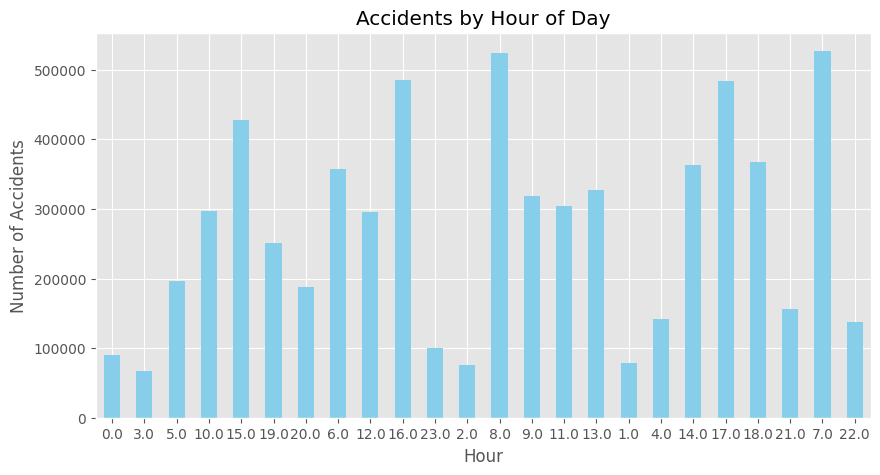

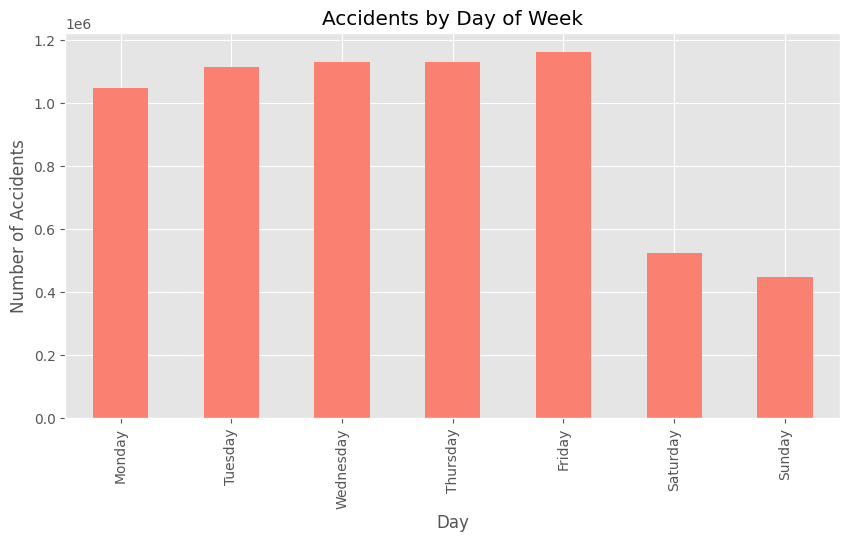

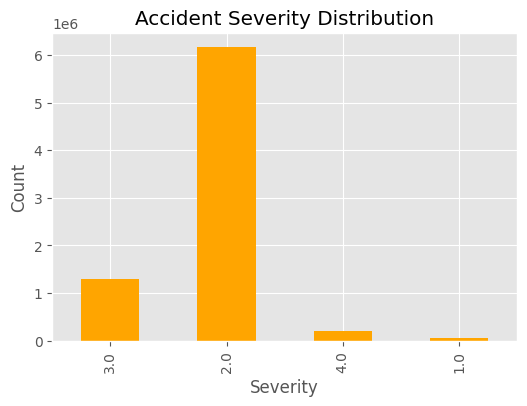

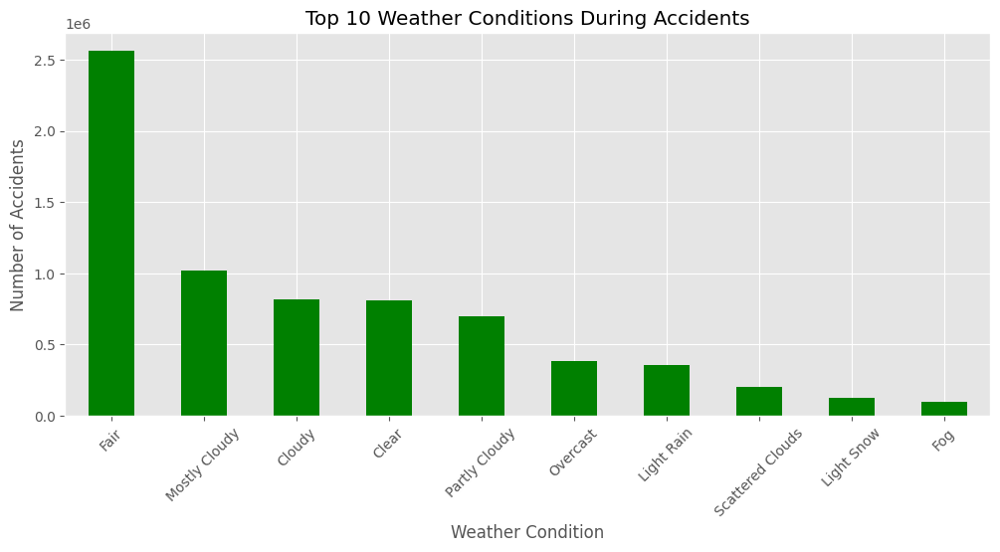

In [27]:
# ============================================================
# Task 04: Traffic Accident Data Analysis (US_Accidents_March23.csv)
# ============================================================
# Objective:
# 1. Identify patterns in accidents related to time, weather, and severity.
# 2. Visualize accident hotspots (heatmap) and contributing factors.
# ============================================================

# ----------------------------
# Step 1: Mount Google Drive
# ----------------------------
from google.colab import drive
drive.mount('/content/drive')  # Grants access to your Drive files

# ----------------------------
# Step 2: Import Libraries
# ----------------------------
import dask.dataframe as dd
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap

# Optional: Make plots look better
plt.style.use('ggplot')

# ----------------------------
# Step 3: Load Dataset (Dask)
# ----------------------------
# Only load columns needed for analysis
cols = ['Severity', 'Start_Time', 'Start_Lat', 'Start_Lng', 'Weather_Condition']

# Use blocksize for memory efficiency
df = dd.read_csv(
    '/content/drive/MyDrive/US_Accidents_March23.csv',
    usecols=cols,
    blocksize="64MB",  # splits large CSV into smaller chunks
    assume_missing=True
)

# ----------------------------
# Step 4: Preprocess Data
# ----------------------------
# Convert Start_Time to datetime
df['Start_Time'] = dd.to_datetime(df['Start_Time'], errors='coerce')

# Extract hour of day and day of week
df['hour'] = df['Start_Time'].dt.hour
df['day'] = df['Start_Time'].dt.day_name()

# ----------------------------
# Step 5: Time-Based Analysis
# ----------------------------
# Accidents by hour
hourly = df.groupby('hour').size().compute()
plt.figure(figsize=(10,5))
hourly.plot(kind='bar', color='skyblue')
plt.title('Accidents by Hour of Day')
plt.xlabel('Hour')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=0)
plt.show()

# Accidents by day of week
daily = df.groupby('day').size().compute()
# Ensure correct order of weekdays
daily = daily.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.figure(figsize=(10,5))
daily.plot(kind='bar', color='salmon')
plt.title('Accidents by Day of Week')
plt.xlabel('Day')
plt.ylabel('Number of Accidents')
plt.show()

# ----------------------------
# Step 6: Severity Distribution
# ----------------------------
severity_dist = df.groupby('Severity').size().compute()
plt.figure(figsize=(6,4))
severity_dist.plot(kind='bar', color='orange')
plt.title('Accident Severity Distribution')
plt.xlabel('Severity')
plt.ylabel('Count')
plt.show()

# ----------------------------
# Step 7: Weather Condition Analysis
# ----------------------------
weather = df.groupby('Weather_Condition').size().compute().sort_values(ascending=False).head(10)
plt.figure(figsize=(12,5))
weather.plot(kind='bar', color='green')
plt.title('Top 10 Weather Conditions During Accidents')
plt.xlabel('Weather Condition')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)
plt.show()

# ----------------------------
# Step 8: Hotspot Visualization (Heatmap)
# ----------------------------
# Sample 3% of data for plotting to improve performance
sample = df.sample(frac=0.03, random_state=42).compute()

# Remove missing lat/lng rows
sample = sample.dropna(subset=['Start_Lat', 'Start_Lng'])

# Create a Folium map centered on US
m = folium.Map(
    location=[sample.Start_Lat.mean(), sample.Start_Lng.mean()],
    zoom_start=5
)

# Add heatmap layer
HeatMap(sample[['Start_Lat','Start_Lng']].values).add_to(m)

# Save heatmap as HTML
m.save('/content/drive/MyDrive/US_Accidents_Heatmap.html')

# Display in notebook
m

# ----------------------------
# Step 9: Notes for Report / README
# ----------------------------
# 1. Time Analysis: Peak accidents during morning & evening hours; weekdays higher than weekends.
# 2. Severity: Most accidents Severity 2-3; high severity rarer but critical.
# 3. Weather: Clear dominates; Rain/Snow show disproportionate severity.
# 4. Hotspots: High density in major urban areas and highways.
# 5. Heatmap saved as interactive HTML for submission/report.


In [29]:
# Step 8: Hotspot Visualization (Heatmap)
# ----------------------------
# Sample 3% of data for plotting to improve performance
sample = df.sample(frac=0.03, random_state=42).compute()

# Remove missing lat/lng rows
sample = sample.dropna(subset=['Start_Lat', 'Start_Lng'])

# Create a Folium map centered on US
m = folium.Map(
    location=[sample.Start_Lat.mean(), sample.Start_Lng.mean()],
    zoom_start=5
)

# Add heatmap layer
HeatMap(sample[['Start_Lat','Start_Lng']].values).add_to(m)
m